# Comprehensive EDA - Flood Segmentation Dataset

        Notebook ini mengaudit dataset 7-channel untuk segmentation banjir:
        Sentinel-1 `VV/VH`, Sentinel-2 HSV, DEMNAS `Slope/HAND`, label UNOSAT flood, valid mask, water/river auxiliary mask, dan tile train/val/test.

        Semantik label yang dipakai:
        - `label_flood_binary`: flood positif hanya dari `FloodExtent_*` UNOSAT.
        - `label_valid_mask`: batas area analisis; area `0` harus di-ignore saat training/evaluasi.
        - `label_water_river_mask`: auxiliary water/river, bukan label flood positif.


In [1]:
from pathlib import Path
from collections import Counter, defaultdict
import csv
import json
import math
import re
import subprocess

import numpy as np
import matplotlib.pyplot as plt
from osgeo import gdal
from IPython.display import display, Markdown

gdal.UseExceptions()

ROOT = Path.cwd().resolve()
if ROOT.name == "notebooks":
    ROOT = ROOT.parent

DATASET = ROOT / "dataset"
FEATURE_DIR = DATASET / "features_preprocessed"
LABEL_DIR = DATASET / "labels_unosat_rasterized"
TILE_DIR = DATASET / "tiles" / "7ch"
OUT_DIR = ROOT / "notebooks" / "eda_outputs"
OUT_DIR.mkdir(parents=True, exist_ok=True)

CHANNELS = ["VV", "VH", "Hue", "Saturation", "Value", "Slope", "HAND"]

def read_csv(path):
    with path.open(newline="") as f:
        rows = list(csv.DictReader(f))
    for row in rows:
        for key, value in list(row.items()):
            if value is None or value == "":
                continue
            try:
                row[key] = int(value)
            except ValueError:
                try:
                    row[key] = float(value)
                except ValueError:
                    pass
    return rows

def table(rows, columns=None, limit=None):
    rows = rows if limit is None else rows[:limit]
    if not rows:
        display(Markdown("_No rows._"))
        return
    columns = columns or list(rows[0].keys())
    header = "| " + " | ".join(columns) + " |"
    sep = "| " + " | ".join(["---"] * len(columns)) + " |"
    body = []
    for row in rows:
        vals = []
        for col in columns:
            val = row.get(col, "")
            if isinstance(val, float):
                val = f"{val:.4f}"
            vals.append(str(val))
        body.append("| " + " | ".join(vals) + " |")
    display(Markdown("\n".join([header, sep] + body)))

pre_summary = read_csv(DATASET / "preprocessing_summary.csv")
feature_summary = read_csv(DATASET / "feature_preprocessing_summary.csv")
verification = read_csv(DATASET / "preprocessing_verification_report.csv")

regions = sorted([p.name for p in FEATURE_DIR.iterdir() if p.is_dir()])
print(f"Repo root: {ROOT}")
print(f"Regions: {len(regions)} -> {regions}")
print(f"Tile root exists: {TILE_DIR.exists()}")


Repo root: /home/nozomi/Productive/skripsi
Regions: 11 -> ['Aceh_Besar', 'Aceh_Tamiang', 'Aceh_Timur', 'Aceh_Utara', 'Agam', 'Banda_Aceh', 'Bireuen', 'Langsa', 'Pasaman_Barat', 'Pidie', 'Pidie_Jaya']
Tile root exists: True


## 1. Dataset Inventory


In [2]:
inventory = []
required_feature_files = [
    "stack_7ch.tif", "vv_norm.tif", "vh_norm.tif", "hue.tif", "saturation.tif", "value.tif",
    "slope_norm.tif", "hand_norm.tif", "feature_valid_mask.tif", "s2_valid_mask.tif",
]
required_label_files = ["label_flood_binary.tif", "label_valid_mask.tif", "label_water_river_mask.tif"]

for region in regions:
    feature_missing = [name for name in required_feature_files if not (FEATURE_DIR / region / name).exists()]
    label_missing = [name for name in required_label_files if not (LABEL_DIR / region / name).exists()]
    tile_count = sum(1 for _ in TILE_DIR.glob(f"*/*{region}*.npz"))
    inventory.append({
        "region": region,
        "feature_missing": ", ".join(feature_missing) or "-",
        "label_missing": ", ".join(label_missing) or "-",
        "tile_count": tile_count,
    })

table(inventory, ["region", "tile_count", "feature_missing", "label_missing"])


| region | tile_count | feature_missing | label_missing |
| --- | --- | --- | --- |
| Aceh_Besar | 128 | - | - |
| Aceh_Tamiang | 116 | - | - |
| Aceh_Timur | 267 | - | - |
| Aceh_Utara | 122 | - | - |
| Agam | 96 | - | - |
| Banda_Aceh | 7 | - | - |
| Bireuen | 73 | - | - |
| Langsa | 13 | - | - |
| Pasaman_Barat | 161 | - | - |
| Pidie | 138 | - | - |
| Pidie_Jaya | 36 | - | - |

## 2. Raster Shape, CRS, Bounds, and Alignment Audit


In [3]:
def raster_meta(path):
    ds = gdal.Open(str(path))
    gt = ds.GetGeoTransform()
    proj = ds.GetProjectionRef()
    return {
        "width": ds.RasterXSize,
        "height": ds.RasterYSize,
        "bands": ds.RasterCount,
        "pixel_x": gt[1],
        "pixel_y": gt[5],
        "origin_x": gt[0],
        "origin_y": gt[3],
        "projection_prefix": proj[:80],
    }

alignment_rows = []
for region in regions:
    stack = raster_meta(FEATURE_DIR / region / "stack_7ch.tif")
    flood = raster_meta(LABEL_DIR / region / "label_flood_binary.tif")
    valid = raster_meta(LABEL_DIR / region / "label_valid_mask.tif")
    aligned = (
        stack["width"] == flood["width"] == valid["width"] and
        stack["height"] == flood["height"] == valid["height"] and
        abs(stack["pixel_x"] - flood["pixel_x"]) < 1e-9 and
        abs(stack["pixel_y"] - flood["pixel_y"]) < 1e-9 and
        abs(stack["origin_x"] - flood["origin_x"]) < 1e-6 and
        abs(stack["origin_y"] - flood["origin_y"]) < 1e-6
    )
    alignment_rows.append({
        "region": region,
        "shape": f'{stack["height"]}x{stack["width"]}',
        "bands": stack["bands"],
        "pixel_m": f'{stack["pixel_x"]:.1f}x{abs(stack["pixel_y"]):.1f}',
        "aligned_label": aligned,
    })

table(alignment_rows, ["region", "shape", "bands", "pixel_m", "aligned_label"])


| region | shape | bands | pixel_m | aligned_label |
| --- | --- | --- | --- | --- |
| Aceh_Besar | 8175x9662 | 7 | 10.0x10.0 | True |
| Aceh_Tamiang | 7013x6210 | 7 | 10.0x10.0 | True |
| Aceh_Timur | 12096x8470 | 7 | 10.0x10.0 | True |
| Aceh_Utara | 5824x8101 | 7 | 10.0x10.0 | True |
| Agam | 4961x8606 | 7 | 10.0x10.0 | True |
| Banda_Aceh | 1058x1166 | 7 | 10.0x10.0 | True |
| Bireuen | 4275x6653 | 7 | 10.0x10.0 | True |
| Langsa | 1727x2407 | 7 | 10.0x10.0 | True |
| Pasaman_Barat | 8117x9995 | 7 | 10.0x10.0 | True |
| Pidie | 9918x8311 | 7 | 10.0x10.0 | True |
| Pidie_Jaya | 4303x3820 | 7 | 10.0x10.0 | True |

## 3. Region-Level Label, Mask, and Split Distribution


In [4]:
split_rows = []
total_tiles = total_pos_tiles = total_flood = total_valid = total_water = 0
for row in pre_summary:
    valid_pixels = int(row["valid_pixels"])
    flood_pixels = int(row["flood_pixels"])
    tile_count = int(row["tile_count"])
    positive_tile_count = int(row["positive_tile_count"])
    split_rows.append({
        "region": row["region"],
        "split": row["split"],
        "tiles": tile_count,
        "positive_tiles": positive_tile_count,
        "positive_tile_pct": 100 * positive_tile_count / tile_count,
        "flood_pct_valid": 100 * flood_pixels / valid_pixels if valid_pixels else 0,
        "water_river_pct_valid": 100 * int(row["water_river_pixels"]) / valid_pixels if valid_pixels else 0,
        "s2_valid_pct_tile_pixels": 100 * int(row["s2_valid_pixels"]) / (tile_count * 512 * 512),
    })
    total_tiles += tile_count
    total_pos_tiles += positive_tile_count
    total_flood += flood_pixels
    total_valid += valid_pixels
    total_water += int(row["water_river_pixels"])

display(Markdown(
    f"**Total tile:** {total_tiles:,}  \n"
    f"**Positive tile:** {total_pos_tiles:,} ({100*total_pos_tiles/total_tiles:.2f}%)  \n"
    f"**Flood pixel / valid pixel:** {total_flood:,} / {total_valid:,} ({100*total_flood/total_valid:.2f}%)  \n"
    f"**Water/river auxiliary / valid pixel:** {total_water:,} / {total_valid:,} ({100*total_water/total_valid:.2f}%)"
))
table(split_rows, ["region", "split", "tiles", "positive_tiles", "positive_tile_pct", "flood_pct_valid", "water_river_pct_valid", "s2_valid_pct_tile_pixels"])


**Total tile:** 1,121  
**Positive tile:** 593 (52.90%)  
**Flood pixel / valid pixel:** 13,602,838 / 288,370,229 (4.72%)  
**Water/river auxiliary / valid pixel:** 14,918,949 / 288,370,229 (5.17%)

| region | split | tiles | positive_tiles | positive_tile_pct | flood_pct_valid | water_river_pct_valid | s2_valid_pct_tile_pixels |
| --- | --- | --- | --- | --- | --- | --- | --- |
| Aceh_Besar | train | 128 | 64 | 50.0000 | 1.8859 | 2.4903 | 63.6196 |
| Aceh_Tamiang | train | 116 | 83 | 71.5517 | 4.1259 | 5.4248 | 0.0006 |
| Aceh_Timur | train | 267 | 129 | 48.3146 | 6.6866 | 8.1187 | 39.7659 |
| Aceh_Utara | train | 122 | 80 | 65.5738 | 13.2881 | 13.4056 | 62.2701 |
| Agam | train | 96 | 36 | 37.5000 | 1.4383 | 0.0000 | 0.0000 |
| Banda_Aceh | train | 7 | 7 | 100.0000 | 3.3699 | 6.0596 | 15.1380 |
| Bireuen | train | 73 | 40 | 54.7945 | 2.8581 | 3.6241 | 75.1007 |
| Langsa | train | 13 | 13 | 100.0000 | 9.1332 | 12.6022 | 0.0000 |
| Pasaman_Barat | train | 161 | 72 | 44.7205 | 0.9212 | 0.0000 | 0.0032 |
| Pidie | test | 102 | 51 | 50.0000 | 3.9952 | 4.4554 | 69.5359 |
| Pidie_Jaya | val | 36 | 18 | 50.0000 | 3.5587 | 4.2677 | 72.8320 |

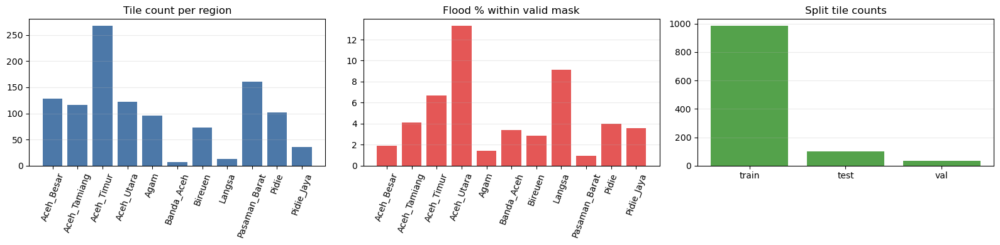

In [5]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
names = [r["region"] for r in split_rows]
axes[0].bar(names, [r["tiles"] for r in split_rows], color="#4C78A8")
axes[0].set_title("Tile count per region")
axes[0].tick_params(axis="x", rotation=70)

axes[1].bar(names, [r["flood_pct_valid"] for r in split_rows], color="#E45756")
axes[1].set_title("Flood % within valid mask")
axes[1].tick_params(axis="x", rotation=70)

split_counter = Counter(r["split"] for r in pre_summary)
split_tile_counts = defaultdict(int)
for r in pre_summary:
    split_tile_counts[r["split"]] += int(r["tile_count"])
axes[2].bar(list(split_tile_counts), list(split_tile_counts.values()), color="#54A24B")
axes[2].set_title("Split tile counts")
for ax in axes:
    ax.grid(axis="y", alpha=0.25)
plt.tight_layout()
plt.show()


## 4. Feature Validity and Known Sparse Sentinel-2 Regions


In [6]:
feature_rows = []
for row in feature_summary:
    feature_rows.append({
        "region": row["region"],
        "s2_valid_pct": row["s2_valid_pct"],
        "feature_valid_pct": row["feature_valid_pct"],
        "label_valid_pct": row["label_valid_pct"],
        "flood_pixels": int(row["flood_pixels"]),
        "water_river_pixels": int(row["water_river_pixels"]),
    })

table(feature_rows, ["region", "s2_valid_pct", "feature_valid_pct", "label_valid_pct", "flood_pixels", "water_river_pixels"])

sparse_s2 = [r for r in feature_rows if r["s2_valid_pct"] < 1.0]
display(Markdown("**Regions with S2 valid < 1%:** " + ", ".join(r["region"] for r in sparse_s2)))


| region | s2_valid_pct | feature_valid_pct | label_valid_pct | flood_pixels | water_river_pixels |
| --- | --- | --- | --- | --- | --- |
| Aceh_Besar | 28.4479 | 35.9132 | 83.8923 | 628789 | 852351 |
| Aceh_Tamiang | 0.0004 | 49.6807 | 100.0000 | 1223088 | 1653066 |
| Aceh_Timur | 28.7648 | 52.2497 | 100.0000 | 4599286 | 5670028 |
| Aceh_Utara | 45.5820 | 56.3729 | 100.0000 | 4194022 | 4381357 |
| Agam | 0.0000 | 51.5946 | 97.1876 | 359611 | 0 |
| Bireuen | 55.9227 | 62.6938 | 100.0000 | 546763 | 713415 |
| Banda_Aceh | 37.5369 | 42.0761 | 100.0000 | 23904 | 71771 |
| Langsa | 0.0000 | 52.0175 | 100.0000 | 264247 | 377192 |
| Pasaman_Barat | 0.0016 | 47.0870 | 100.0000 | 385168 | 0 |
| Pidie | 36.8179 | 38.3262 | 100.0000 | 1052181 | 1283402 |
| Pidie_Jaya | 52.3073 | 56.4286 | 100.0000 | 325779 | 396158 |

**Regions with S2 valid < 1%:** Aceh_Tamiang, Agam, Langsa, Pasaman_Barat

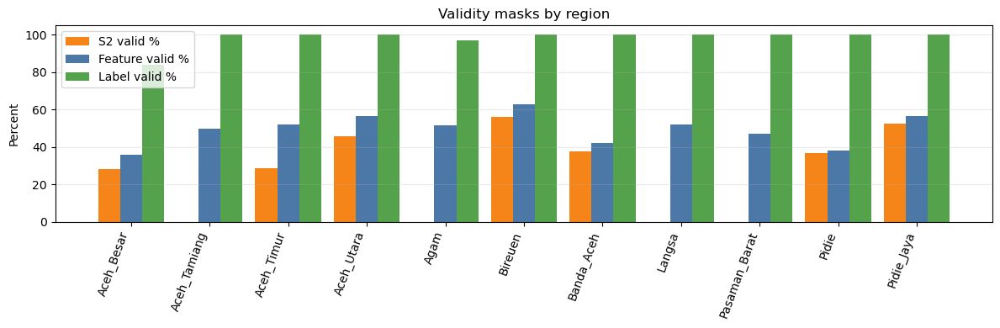

In [7]:
fig, ax = plt.subplots(figsize=(12, 4))
x = np.arange(len(feature_rows))
width = 0.28
ax.bar(x - width, [r["s2_valid_pct"] for r in feature_rows], width, label="S2 valid %", color="#F58518")
ax.bar(x, [r["feature_valid_pct"] for r in feature_rows], width, label="Feature valid %", color="#4C78A8")
ax.bar(x + width, [r["label_valid_pct"] for r in feature_rows], width, label="Label valid %", color="#54A24B")
ax.set_xticks(x)
ax.set_xticklabels([r["region"] for r in feature_rows], rotation=70, ha="right")
ax.set_ylabel("Percent")
ax.set_title("Validity masks by region")
ax.legend()
ax.grid(axis="y", alpha=0.25)
plt.tight_layout()
plt.show()


## 5. Tile File Audit and Key/Shape Contract


In [8]:
tile_paths = sorted(TILE_DIR.glob("*/*.npz"))
print(f"Tile files found: {len(tile_paths):,}")

expected_keys = {"x", "y", "valid_mask", "water_river_mask", "feature_valid_mask", "s2_valid_mask", "region", "row", "col", "channels"}
shape_issues = []
key_issues = []
tile_contract_rows = []
split_counts = Counter()
region_counts = Counter()

for path in tile_paths:
    split_counts[path.parent.name] += 1
    with np.load(path, allow_pickle=False) as z:
        keys = set(z.files)
        region = str(z["region"].item()) if "region" in keys else path.name.split("_r")[0]
        region_counts[region] += 1
        if keys != expected_keys:
            key_issues.append((str(path), sorted(keys ^ expected_keys)))
        checks = {
            "x": (7, 512, 512),
            "y": (1, 512, 512),
            "valid_mask": (1, 512, 512),
            "water_river_mask": (1, 512, 512),
            "feature_valid_mask": (1, 512, 512),
            "s2_valid_mask": (1, 512, 512),
        }
        for key, expected_shape in checks.items():
            if key in keys and z[key].shape != expected_shape:
                shape_issues.append((str(path), key, z[key].shape))

tile_contract_rows.append({"check": "tile_file_count", "value": len(tile_paths), "status": "ok" if len(tile_paths) == total_tiles else "mismatch_csv"})
tile_contract_rows.append({"check": "key_issues", "value": len(key_issues), "status": "ok" if not key_issues else "fail"})
tile_contract_rows.append({"check": "shape_issues", "value": len(shape_issues), "status": "ok" if not shape_issues else "fail"})
table(tile_contract_rows, ["check", "value", "status"])
print("Split counts:", dict(split_counts))
print("Region counts:", dict(sorted(region_counts.items())))


Tile files found: 1,121


| check | value | status |
| --- | --- | --- |
| tile_file_count | 1121 | ok |
| key_issues | 0 | ok |
| shape_issues | 0 | ok |

Split counts: {'test': 102, 'train': 983, 'val': 36}
Region counts: {'Aceh_Besar': 128, 'Aceh_Tamiang': 116, 'Aceh_Timur': 267, 'Aceh_Utara': 122, 'Agam': 96, 'Banda_Aceh': 7, 'Bireuen': 73, 'Langsa': 13, 'Pasaman_Barat': 161, 'Pidie': 102, 'Pidie_Jaya': 36}


## 6. Channel Statistics from Tile Sample


In [9]:
rng = np.random.default_rng(42)
sample_size = min(240, len(tile_paths))
sample_paths = list(rng.choice(np.array(tile_paths, dtype=object), size=sample_size, replace=False))

channel_values = [[] for _ in CHANNELS]
mask_values = {"valid_mask": [], "feature_valid_mask": [], "s2_valid_mask": [], "y": [], "water_river_mask": []}
tile_metric_rows = []

for path in sample_paths:
    with np.load(path, allow_pickle=False) as z:
        x = z["x"].astype(np.float32)
        valid = z["valid_mask"].astype(bool)
        region = str(z["region"].item())
        split = path.parent.name
        for i in range(7):
            vals = x[i][valid[0]]
            if vals.size:
                if vals.size > 5000:
                    vals = rng.choice(vals, size=5000, replace=False)
                channel_values[i].append(vals)
        for key in mask_values:
            arr = z[key]
            vals = arr.reshape(-1)
            if vals.size > 3000:
                vals = rng.choice(vals, size=3000, replace=False)
            mask_values[key].append(vals)
        valid_pixels = int(z["valid_mask"].sum())
        flood_pixels = int(z["y"].sum())
        tile_metric_rows.append({
            "path": path.name,
            "split": split,
            "region": region,
            "valid_pixels": valid_pixels,
            "flood_pixels": flood_pixels,
            "flood_pct_valid": 100 * flood_pixels / valid_pixels if valid_pixels else 0,
            "s2_valid_pct_tile": 100 * int(z["s2_valid_mask"].sum()) / (512*512),
        })

stats_rows = []
for name, parts in zip(CHANNELS, channel_values):
    vals = np.concatenate(parts) if parts else np.array([], dtype=np.float32)
    stats_rows.append({
        "channel": name,
        "n_sample_pixels": vals.size,
        "min": float(np.min(vals)) if vals.size else np.nan,
        "p01": float(np.quantile(vals, 0.01)) if vals.size else np.nan,
        "mean": float(np.mean(vals)) if vals.size else np.nan,
        "p50": float(np.quantile(vals, 0.50)) if vals.size else np.nan,
        "p99": float(np.quantile(vals, 0.99)) if vals.size else np.nan,
        "max": float(np.max(vals)) if vals.size else np.nan,
    })

display(Markdown(f"Sampled **{sample_size}** tile files with capped per-channel pixels."))
table(stats_rows, ["channel", "n_sample_pixels", "min", "p01", "mean", "p50", "p99", "max"])


Sampled **240** tile files with capped per-channel pixels.

| channel | n_sample_pixels | min | p01 | mean | p50 | p99 | max |
| --- | --- | --- | --- | --- | --- | --- | --- |
| VV | 1200000 | 0.0000 | 0.0000 | 0.5407 | 0.6817 | 1.0000 | 1.0000 |
| VH | 1200000 | 0.0000 | 0.0000 | 0.3750 | 0.4620 | 0.7964 | 1.0000 |
| Hue | 1200000 | 0.0000 | 0.0000 | 0.1193 | 0.0000 | 0.5425 | 0.9993 |
| Saturation | 1200000 | 0.0000 | 0.0000 | 0.3170 | 0.0000 | 0.9626 | 1.0000 |
| Value | 1200000 | 0.0000 | 0.0000 | 0.1107 | 0.0000 | 0.4672 | 1.0000 |
| Slope | 1200000 | 0.0000 | 0.0000 | 0.1758 | 0.0858 | 0.8654 | 1.0000 |
| HAND | 1200000 | 0.0000 | 0.0000 | 0.4113 | 0.2590 | 1.0000 | 1.0000 |

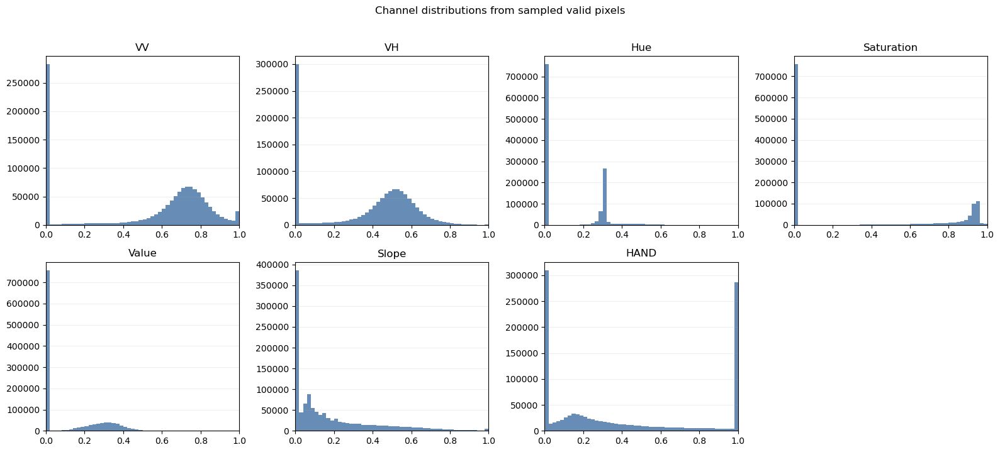

In [10]:
fig, axes = plt.subplots(2, 4, figsize=(16, 7))
axes = axes.ravel()
for i, name in enumerate(CHANNELS):
    vals = np.concatenate(channel_values[i]) if channel_values[i] else np.array([])
    axes[i].hist(vals, bins=50, color="#4C78A8", alpha=0.85)
    axes[i].set_title(name)
    axes[i].set_xlim(0, 1)
    axes[i].grid(axis="y", alpha=0.2)
axes[-1].axis("off")
plt.suptitle("Channel distributions from sampled valid pixels", y=1.02)
plt.tight_layout()
plt.show()


## 7. Correlation Between Channels


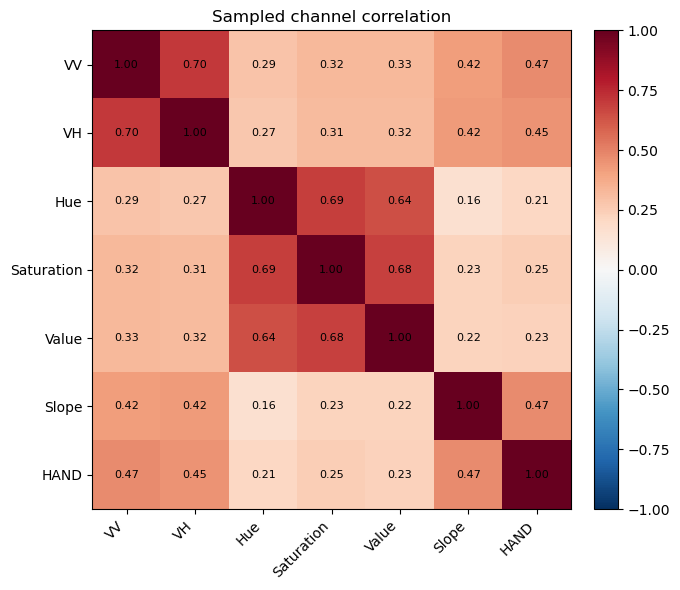

In [11]:
paired = []
for parts in channel_values:
    vals = np.concatenate(parts) if parts else np.array([], dtype=np.float32)
    paired.append(vals)
min_len = min(len(v) for v in paired)
if min_len > 0:
    idx = rng.choice(np.arange(min_len), size=min(200000, min_len), replace=False)
    mat = np.vstack([v[:min_len][idx] for v in paired])
    corr = np.corrcoef(mat)
    fig, ax = plt.subplots(figsize=(7, 6))
    im = ax.imshow(corr, vmin=-1, vmax=1, cmap="RdBu_r")
    ax.set_xticks(range(len(CHANNELS)))
    ax.set_yticks(range(len(CHANNELS)))
    ax.set_xticklabels(CHANNELS, rotation=45, ha="right")
    ax.set_yticklabels(CHANNELS)
    for r in range(len(CHANNELS)):
        for c in range(len(CHANNELS)):
            ax.text(c, r, f"{corr[r, c]:.2f}", ha="center", va="center", fontsize=8)
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    ax.set_title("Sampled channel correlation")
    plt.tight_layout()
    plt.show()
else:
    print("No sampled channel pixels available.")


## 8. Spatial Quicklooks by Region


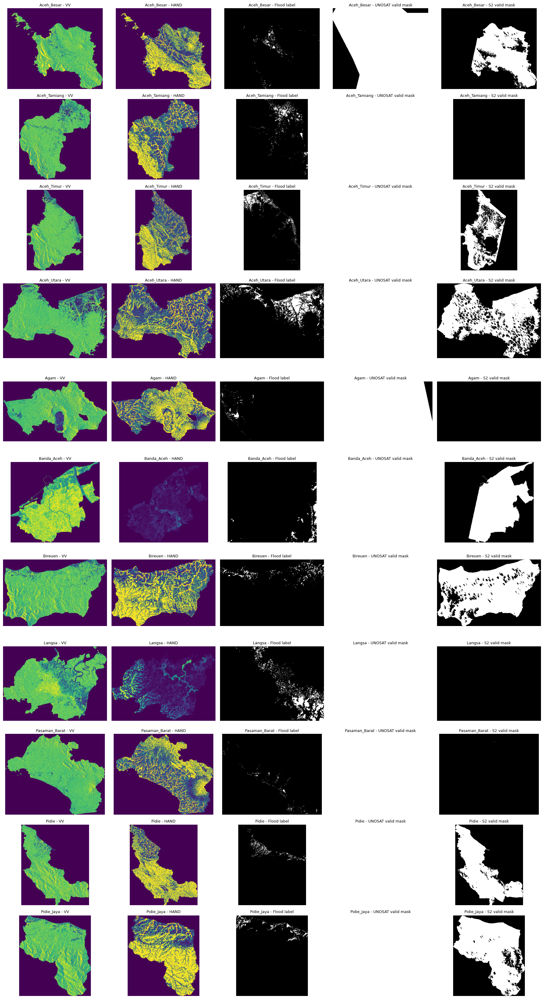

In [12]:
def read_overview(path, band=1, max_size=512):
    ds = gdal.Open(str(path))
    w, h = ds.RasterXSize, ds.RasterYSize
    scale = min(max_size / w, max_size / h, 1.0)
    out_w, out_h = max(1, int(w * scale)), max(1, int(h * scale))
    arr = ds.GetRasterBand(band).ReadAsArray(buf_xsize=out_w, buf_ysize=out_h).astype(np.float32)
    return arr

preview_regions = regions
fig, axes = plt.subplots(len(preview_regions), 5, figsize=(18, 3 * len(preview_regions)))
for row_idx, region in enumerate(preview_regions):
    stack = FEATURE_DIR / region / "stack_7ch.tif"
    flood = LABEL_DIR / region / "label_flood_binary.tif"
    valid = LABEL_DIR / region / "label_valid_mask.tif"
    s2 = FEATURE_DIR / region / "s2_valid_mask.tif"
    panels = [
        (read_overview(stack, 1), "VV", "viridis", 0, 1),
        (read_overview(stack, 7), "HAND", "viridis", 0, 1),
        (read_overview(flood, 1), "Flood label", "gray", 0, 1),
        (read_overview(valid, 1), "UNOSAT valid mask", "gray", 0, 1),
        (read_overview(s2, 1), "S2 valid mask", "gray", 0, 1),
    ]
    for col_idx, (arr, title, cmap, vmin, vmax) in enumerate(panels):
        ax = axes[row_idx, col_idx]
        ax.imshow(arr, cmap=cmap, vmin=vmin, vmax=vmax)
        ax.set_title(f"{region} - {title}", fontsize=9)
        ax.axis("off")
plt.tight_layout()
plt.show()


## 9. Representative Tile Visual Audit


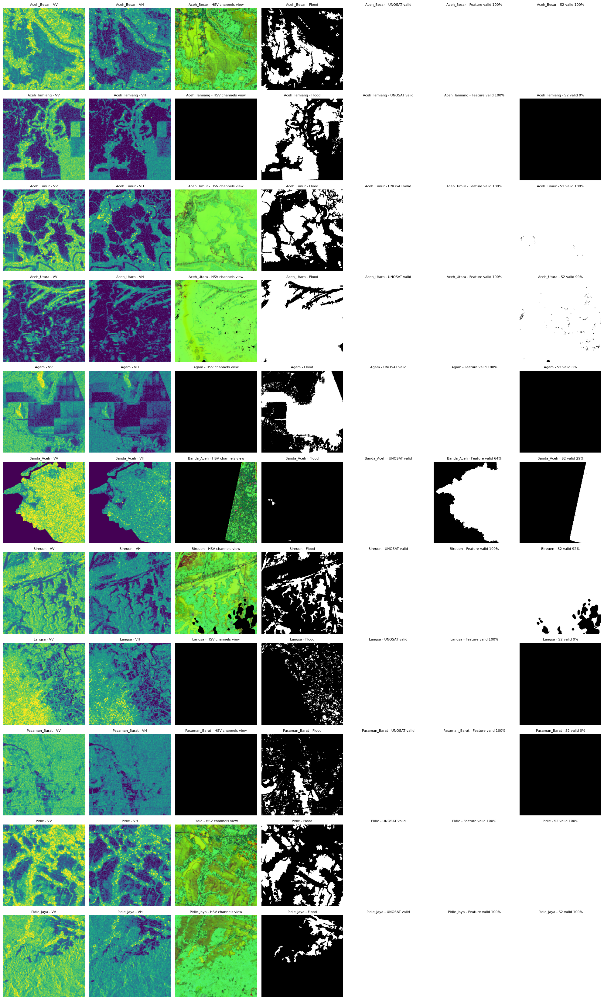

In [13]:
def tile_ratio(arr):
    return float(arr.sum()) / float(arr.size)

def pick_tile(region=None, positive=True, min_feature_valid=0.70):
    candidates = [p for p in tile_paths if region is None or region in p.name]
    scored = []
    fallback = []
    for path in candidates:
        with np.load(path, allow_pickle=False) as z:
            has_flood = bool(z["y"].sum() > 0)
            if has_flood != positive:
                continue
            feature_valid_ratio = tile_ratio(z["feature_valid_mask"])
            valid_ratio = tile_ratio(z["valid_mask"])
            flood_pixels = int(z["y"].sum())
            item = (feature_valid_ratio, valid_ratio, flood_pixels, path)
            fallback.append(item)
            if feature_valid_ratio >= min_feature_valid:
                scored.append(item)
    pool = scored if scored else fallback
    if not pool:
        return candidates[0] if candidates else None
    pool.sort(reverse=True, key=lambda item: (item[0], item[1], item[2]))
    return pool[0][3]

selected = []
for region in regions:
    p = pick_tile(region, positive=True, min_feature_valid=0.70)
    if p is not None:
        selected.append(p)

fig, axes = plt.subplots(len(selected), 7, figsize=(20, 3 * len(selected)))
for r, path in enumerate(selected):
    with np.load(path, allow_pickle=False) as z:
        x = z["x"]
        feature_valid_ratio = tile_ratio(z["feature_valid_mask"])
        s2_valid_ratio = tile_ratio(z["s2_valid_mask"])
        region = str(z["region"].item())
        panels = [
            (x[0], "VV", "viridis", 0, 1),
            (x[1], "VH", "viridis", 0, 1),
            (np.moveaxis(x[[2, 3, 4]], 0, -1), "HSV channels view", None, None, None),
            (z["y"][0], "Flood", "gray", 0, 1),
            (z["valid_mask"][0], "UNOSAT valid", "gray", 0, 1),
            (z["feature_valid_mask"][0], f"Feature valid {feature_valid_ratio:.0%}", "gray", 0, 1),
            (z["s2_valid_mask"][0], f"S2 valid {s2_valid_ratio:.0%}", "gray", 0, 1),
        ]
        for c, (arr, title, cmap, vmin, vmax) in enumerate(panels):
            ax = axes[r, c]
            if arr.ndim == 3:
                ax.imshow(arr)
            else:
                ax.imshow(arr, cmap=cmap, vmin=vmin, vmax=vmax)
            ax.set_title(f"{region} - {title}", fontsize=8)
            ax.axis("off")
plt.tight_layout()
plt.show()


## 10. Leakage and Mask Semantics Checks


In [14]:
leak_rows = []
for region in regions:
    flood = read_overview(LABEL_DIR / region / "label_flood_binary.tif", max_size=2048)
    valid = read_overview(LABEL_DIR / region / "label_valid_mask.tif", max_size=2048)
    water = read_overview(LABEL_DIR / region / "label_water_river_mask.tif", max_size=2048)
    flood_bool = flood > 0.5
    valid_bool = valid > 0.5
    water_bool = water > 0.5
    flood_outside_valid = int(np.logical_and(flood_bool, ~valid_bool).sum())
    flood_water_overlap = int(np.logical_and(flood_bool, water_bool).sum())
    water_not_flood = int(np.logical_and(water_bool, ~flood_bool).sum())
    leak_rows.append({
        "region": region,
        "overview_flood_outside_valid_px": flood_outside_valid,
        "overview_flood_water_overlap_px": flood_water_overlap,
        "overview_water_not_flood_px": water_not_flood,
    })

table(leak_rows, ["region", "overview_flood_outside_valid_px", "overview_flood_water_overlap_px", "overview_water_not_flood_px"])
display(Markdown(
    "Interpretasi: `water_not_flood` boleh besar karena water/river hanya auxiliary mask, bukan flood positif. "
    "Nilai `flood_outside_valid` harus diaudit bila non-zero pada resolusi asli; tabel ini memakai overview cepat."
))


| region | overview_flood_outside_valid_px | overview_flood_water_overlap_px | overview_water_not_flood_px |
| --- | --- | --- | --- |
| Aceh_Besar | 0 | 28325 | 10041 |
| Aceh_Tamiang | 0 | 104327 | 36687 |
| Aceh_Timur | 0 | 122424 | 40154 |
| Aceh_Utara | 0 | 240948 | 39067 |
| Agam | 0 | 0 | 0 |
| Banda_Aceh | 0 | 23904 | 47867 |
| Bireuen | 0 | 51745 | 15736 |
| Langsa | 0 | 191150 | 81846 |
| Pasaman_Barat | 0 | 0 | 0 |
| Pidie | 0 | 44862 | 9849 |
| Pidie_Jaya | 0 | 73804 | 15901 |

Interpretasi: `water_not_flood` boleh besar karena water/river hanya auxiliary mask, bukan flood positif. Nilai `flood_outside_valid` harus diaudit bila non-zero pada resolusi asli; tabel ini memakai overview cepat.

## 11. Key Findings


In [15]:
findings = []
if all(r["aligned_label"] for r in alignment_rows):
    findings.append("Semua `stack_7ch`, `label_flood_binary`, dan `label_valid_mask` align pada shape/origin/pixel size yang sama.")
else:
    findings.append("Ada region yang raster fitur dan labelnya tidak align; cek tabel alignment.")

findings.append(f"Dataset tile 7-channel berisi {len(tile_paths):,} file; CSV summary mencatat {total_tiles:,} tile.")
findings.append(f"Flood pixel hanya {100*total_flood/total_valid:.2f}% dari valid pixel; class imbalance kuat.")
findings.append("Split saat ini region-based: train berisi 9 region, validation Pidie_Jaya, test Pidie.")
if sparse_s2:
    findings.append("S2 sangat sparse pada: " + ", ".join(r["region"] for r in sparse_s2) + ". HSV=0 perlu diaudit/di-ablate dengan `s2_valid_mask`.")
if not key_issues and not shape_issues:
    findings.append("Kontrak file `.npz` konsisten: key dan shape tile sesuai ekspektasi training.")

display(Markdown("\n".join(f"- {item}" for item in findings)))


- Semua `stack_7ch`, `label_flood_binary`, dan `label_valid_mask` align pada shape/origin/pixel size yang sama.
- Dataset tile 7-channel berisi 1,121 file; CSV summary mencatat 1,121 tile.
- Flood pixel hanya 4.72% dari valid pixel; class imbalance kuat.
- Split saat ini region-based: train berisi 9 region, validation Pidie_Jaya, test Pidie.
- S2 sangat sparse pada: Aceh_Tamiang, Agam, Langsa, Pasaman_Barat. HSV=0 perlu diaudit/di-ablate dengan `s2_valid_mask`.
- Kontrak file `.npz` konsisten: key dan shape tile sesuai ekspektasi training.